In [1]:
import sys, os
sys.path.append("D:/temp/tfKerasFRCNN-master")

from frcnn.preprocessing.pascal_voc import PascalVocGenerator
from frcnn.utils.transform import random_transform_generator
from frcnn.utils.image import random_visual_effect_generator
import tensorflow as tf
import numpy as np

import matplotlib.pyplot as plt
import cv2
import imageio
import imgaug as ia
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
%matplotlib inline

from frcnn.utils.anchors import anchors_for_shape
from frcnn.utils.defaults import default_anchors_config

Using TensorFlow backend.


In [2]:
image_path = 'D:\\usaod\\VOC2012\\JPEGImages\\huawei_shop1.jpg'
image = cv2.imread(image_path)
anchors = anchors_for_shape((2976, 3968, 3))

image_shapes [array([372, 496], dtype=int32), array([186, 248], dtype=int32), array([ 93, 124], dtype=int32), array([47, 62], dtype=int32), array([24, 31], dtype=int32)]
level 3
len(all_anchors) 1660608
level 4
len(all_anchors) 2075760
level 5
len(all_anchors) 2179548
level 6
len(all_anchors) 2205774
level 7
len(all_anchors) 2212470


In [3]:
transform_generator = random_transform_generator(
    min_rotation=-0.1,
    max_rotation=0.1,
    min_translation=(-0.1, -0.1),
    max_translation=(0.1, 0.1),
    min_shear=-0.1,
    max_shear=0.1,
    min_scaling=(0.9, 0.9),
    max_scaling=(1.1, 1.1),
    flip_x_chance=0.5,
    flip_y_chance=0.5,
)
visual_effect_generator = random_visual_effect_generator(
    contrast_range=(0.9, 1.1),
    brightness_range=(-.1, .1),
    hue_range=(-0.05, 0.05),
    saturation_range=(0.95, 1.05)
)

In [4]:
def preprocess_image(x, mode='tf'):
    """ Preprocess an image by subtracting the ImageNet mean.
    Args
        x: np.array of shape (None, None, 3) or (3, None, None).
        mode: One of "caffe" or "tf".
            - caffe: will zero-center each color channel with
                respect to the ImageNet dataset, without scaling.
            - tf: will scale pixels between -1 and 1, sample-wise.
    Returns
        The input with the ImageNet mean subtracted.
    """
    # Mostly identical to "https://github.com/keras-team/keras-applications/blob/master/keras_applications/imagenet_utils.py"
    # except for converting RGB -> BGR since we assume BGR already.

    # Covert always to float32 to keep compatibility with opencv.
    x = x.astype(np.float32)

    if mode == 'tf':
        x /= 127.5
        x -= 1.
    elif mode == 'caffe':
        x[..., 0] -= 103.939
        x[..., 1] -= 116.779
        x[..., 2] -= 123.68

    return x

In [5]:
common_args = {
    'batch_size'       : 1,
    'config'           : '',
    'image_min_side'   : 800,
    'image_max_side'   : 1333,
    'no_resize'        : True,
    'preprocess_image' : preprocess_image,
}

In [6]:
train_generator = PascalVocGenerator(
    'D:\\usaod\\VOC2012',
    'train',
    image_extension='.jpg',
    transform_generator=None,
    visual_effect_generator=None,
    **common_args
)

In [7]:
data_x, data_y = train_generator[0]

annotations_group [{'labels': array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0.]), 'bboxes': array([[7.000e+00, 2.270e+02, 4.210e+02, 9.090e+02],
       [3.710e+02, 2.500e+02, 8.660e+02, 9.180e+02],
       [8.550e+02, 1.570e+02, 1.350e+03, 8.250e+02],
       [1.357e+03, 1.680e+02, 1.785e+03, 8.270e+02],
       [1.809e+03, 3.200e+02, 2.237e+03, 9.790e+02],
       [2.266e+03, 3.090e+02, 2.694e+03, 9.680e+02],
       [2.705e+03, 2.520e+02, 3.171e+03, 9.680e+02],
       [3.148e+03, 2.770e+02, 3.630e+03, 8.590e+02],
       [3.000e+00, 1.636e+03, 2.350e+02, 1.982e+03],
       [2.210e+02, 1.614e+03, 6.440e+02, 1.996e+03],
       [6.390e+02, 1.650e+03, 1.016e+03, 2.000e+03],
       [1.035e+03, 1.618e+03, 1.412e+03, 1.982e+03],
       [1.416e+03, 1.623e+03, 1.771e+03, 1.996e+03],
       [1.807e+03, 1.614e+03, 2.148e+03, 2.000e+03],
       [2.194e+03, 1.650e+03, 2.516e+03, 2.000e+03],
       [2.544e+03, 1.641e+03, 2.898e+03, 1.99

In [8]:
data_y[0][0][0]

array([  2.8314564,  51.776505 ,  43.572426 , 197.47864  ,   0.       ],
      dtype=float32)

In [39]:
bboxs = list()
regress = list()
for i,regress_box in enumerate(data_y[0][0]):
    regress_x1, regress_y1, regress_x2, regress_y2, flag = regress_box
    if flag == -1.0:
        anchor_x1, anchor_y1, anchor_x2, anchor_y2 = anchors[i]
        anchor_widths  = anchor_x2 - anchor_x1
        anchor_heights = anchor_y2 - anchor_y1
        
        bbox_dx1 = (regress_x1 * 0.2 * anchor_widths + anchor_x1)
        bbox_dy1 = (regress_y1 * 0.2 * anchor_heights + anchor_y1)
        bbox_dx2 = (regress_x2 * 0.2 * anchor_widths + anchor_x2)
        bbox_dy2 = (regress_y2 * 0.2 * anchor_heights + anchor_y2)
        bbox = BoundingBox(x1=bbox_dx1, x2=bbox_dx2, y1=bbox_dy1, y2=bbox_dy2)
        bboxs.append(bbox)
        regress.append(regress_box)

In [45]:
bboxs[100:200]

[BoundingBox(x1=7.0000, y1=227.0000, x2=421.0000, y2=909.0000, label=None),
 BoundingBox(x1=371.0000, y1=250.0000, x2=866.0000, y2=918.0000, label=None),
 BoundingBox(x1=371.0000, y1=250.0000, x2=866.0000, y2=918.0000, label=None),
 BoundingBox(x1=371.0000, y1=250.0000, x2=866.0000, y2=918.0000, label=None),
 BoundingBox(x1=371.0000, y1=250.0000, x2=866.0000, y2=918.0000, label=None),
 BoundingBox(x1=371.0000, y1=250.0000, x2=866.0000, y2=918.0000, label=None),
 BoundingBox(x1=371.0000, y1=250.0000, x2=866.0000, y2=918.0000, label=None),
 BoundingBox(x1=371.0000, y1=250.0000, x2=866.0000, y2=918.0000, label=None),
 BoundingBox(x1=371.0000, y1=250.0000, x2=866.0000, y2=918.0000, label=None),
 BoundingBox(x1=855.0000, y1=157.0000, x2=1350.0000, y2=825.0000, label=None),
 BoundingBox(x1=855.0000, y1=157.0000, x2=1350.0000, y2=825.0000, label=None),
 BoundingBox(x1=855.0000, y1=157.0000, x2=1350.0000, y2=825.0000, label=None),
 BoundingBox(x1=855.0000, y1=157.0000, x2=1350.0000, y2=825.000

In [41]:
len(bboxs)

1604

In [42]:
regress[1:2]

[array([ 0.60519683, -0.157646  ,  1.3142141 ,  3.3566644 , -1.        ],
       dtype=float32)]

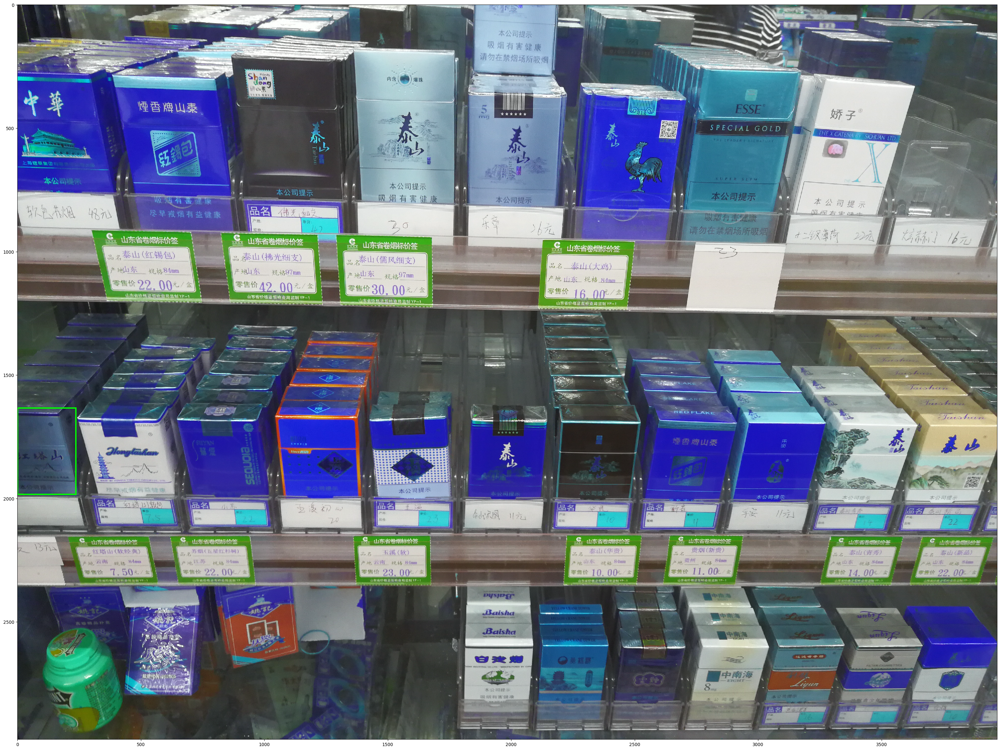

In [44]:
bbs = BoundingBoxesOnImage(bboxs[100:200], shape=image.shape)
ia.imshow(bbs.draw_on_image(image, size=5))

In [12]:
def compute_resize_scale(image_shape, min_side=800, max_side=1333):
    """ Compute an image scale such that the image size is constrained to min_side and max_side.
    Args
        min_side: The image's min side will be equal to min_side after resizing.
        max_side: If after resizing the image's max side is above max_side, resize until the max side is equal to max_side.
    Returns
        A resizing scale.
    """
    (rows, cols, _) = image_shape

    smallest_side = min(rows, cols)

    # Rescale the image so the smallest side is min_side.
    scale = min_side / smallest_side

    # Check if the largest side is now greater than max_side, which can happen
    # when images have a large aspect ratio.
    largest_side = max(rows, cols)
    if largest_side * scale > max_side:
        scale = max_side / largest_side

    return scale

In [13]:
scale = compute_resize_scale((2976, 3968, 3))

In [14]:
img = cv2.resize(image, None, fx=scale, fy=scale)

In [15]:
img.shape

(800, 1067, 3)